In [1]:
from google.colab import files
uploaded = files.upload()
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [41]:
!pip install -Uq fastai fastcore
!pip install -q pandas_read_xml ipython-autotime icevision[all] icedata
%load_ext autotime

ERROR: icevision 0.5.2 has requirement fastcore<1.3.3,>=1.3.0, but you'll have fastcore 1.3.19 which is incompatible.
ERROR: icevision 0.5.2 has requirement requests>=2.24.0<3, but you'll have requests 2.23.0 which is incompatible.
ERROR: icevision 0.5.2 has requirement requests>=2.24.0<3, but you'll have requests 2.23.0 which is incompatible.
The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
time: 6.07 s (started: 2021-03-08 07:58:42 +00:00)


In [42]:
from google.colab.patches import *
import PIL
# from fastcore.parallel import *
from icevision.all import *
import icedata

time: 2.87 ms (started: 2021-03-08 07:58:48 +00:00)


# Datasets

## Neel's Dataset

In [4]:
from fastai.vision.all import *
import pandas as pd
import glob

time: 1.38 ms (started: 2021-03-08 07:43:29 +00:00)


In [13]:
%cd /content

/content
time: 1.16 ms (started: 2021-03-08 07:45:17 +00:00)


In [14]:
!rm '/content/pool+solar_panel.tar'
!cp '/content/drive/MyDrive/pool+solar_panel.tar' '/content/pool+solar_panel.tar'

rm: cannot remove '/content/pool+solar_panel.tar': No such file or directory
time: 12 s (started: 2021-03-08 07:45:18 +00:00)


In [15]:
!rm -Rf pool+solar_panel/solar_panel_pool
!tar -xvf '/content/pool+solar_panel.tar'

pool+solar_panel/
pool+solar_panel/ds0/
pool+solar_panel/ds0/ann/
pool+solar_panel/ds0/ann/Screen Shot 2021-02-14 at 6.09.21 am.png.json
pool+solar_panel/ds0/ann/Screen Shot 2021-02-14 at 6.09.25 am.png.json
pool+solar_panel/ds0/ann/Screen Shot 2021-02-14 at 6.09.29 am.png.json
pool+solar_panel/ds0/ann/Screen Shot 2021-02-14 at 6.09.32 am.png.json
pool+solar_panel/ds0/ann/Screen Shot 2021-02-14 at 6.09.36 am.png.json
pool+solar_panel/ds0/ann/Screen Shot 2021-02-14 at 6.09.42 am.png.json
pool+solar_panel/ds0/ann/Screen Shot 2021-02-14 at 6.09.57 am.png.json
pool+solar_panel/ds0/ann/Screen Shot 2021-02-14 at 6.10.04 am.png.json
pool+solar_panel/ds0/ann/Screen Shot 2021-02-14 at 6.10.46 am.png.json
pool+solar_panel/ds0/ann/Screen Shot 2021-02-14 at 6.10.50 am.png.json
pool+solar_panel/ds0/ann/Screen Shot 2021-02-14 at 6.11.08 am.png.json
pool+solar_panel/ds0/ann/Screen Shot 2021-02-14 at 6.11.12 am.png.json
pool+solar_panel/ds0/ann/Screen Shot 2021-02-14 at 6.11.17 am.png.json
pool+solar_

In [16]:
imgs = glob.glob('/content/pool+solar_panel/*/img/*.*')
anns = glob.glob('/content/pool+solar_panel/*/ann/*.*')

def copy_file_to_location(file, location):
  shutil.copyfile(str(file), str(Path(location)/Path(file).name))

!mkdir -p /content/pool+solar_panel/img
!mkdir -p /content/pool+solar_panel/ann

for file in imgs:
  copy_file_to_location(file, '/content/pool+solar_panel/img')
for file in anns:
  copy_file_to_location(file, '/content/pool+solar_panel/ann')

time: 4.71 s (started: 2021-03-08 07:45:35 +00:00)


In [17]:
%cd /content/pool+solar_panel/

/content/pool+solar_panel
time: 2.82 ms (started: 2021-03-08 07:45:40 +00:00)


## Read kaggle data

In [21]:
!kaggle datasets download kbhartiya83/swimming-pool-and-car-detection

 98% 109M/111M [00:01<00:00, 72.7MB/s] 
100% 111M/111M [00:01<00:00, 85.3MB/s]
time: 2.43 s (started: 2021-03-08 07:46:19 +00:00)


In [22]:
!unzip -q \*.zip

time: 1.73 s (started: 2021-03-08 07:46:22 +00:00)


In [23]:
from pathlib import Path

TRAIN = Path('training_data/training_data')
TRAIN_IMG = TRAIN/'images'
TRAIN_LABELS = TRAIN/'labels'
TEST = Path('/test_data_images/test_data_images')
TEST_IMG = TEST/'images'

time: 2.26 ms (started: 2021-03-08 07:46:23 +00:00)


In [24]:
import glob
files = list(glob.glob(str(TRAIN_LABELS/'*.xml')))

time: 18.4 ms (started: 2021-03-08 07:46:23 +00:00)


In [25]:
import pandas_read_xml as pdx
from tqdm.notebook import tqdm

def _append_to_df(df, df1):
  return df.append(df1, ignore_index = True, sort = True)

def read_one_xml(xml):
  df = pdx.read_xml(xml).T
  df.index = [0]
  df = pdx.fully_flatten(df)
  return df

kaggle_df = read_one_xml(files[0])
for file in tqdm(files[1:]):
  df1 = read_one_xml(file)
  kaggle_df = _append_to_df(kaggle_df, df1)

  0%|          | 0/3747 [00:00<?, ?it/s]

time: 2min 36s (started: 2021-03-08 07:46:23 +00:00)


In [26]:
kaggle_df.head(1)

,filename,object|bndbox|xmax,object|bndbox|xmin,object|bndbox|ymax,object|bndbox|ymin,object|name,size|depth,size|height,size|width,source|annotation
0,000003446.jpg,184.52,140.07,95.44,51.00,2,3,224,224,ArcGIS Pro 2.1


time: 27.2 ms (started: 2021-03-08 07:49:00 +00:00)


### Get bbox

In [27]:
def listify_df(df, cols): 
  for col in cols: df[col] = df[col].apply(lambda x: [x])
  return df

kaggle_df = listify_df(kaggle_df, cols = ['object|bndbox|xmin', 'object|bndbox|ymin', 'object|bndbox|xmax', 'object|bndbox|ymax'])
kaggle_df.head()

,filename,object|bndbox|xmax,object|bndbox|xmin,object|bndbox|ymax,object|bndbox|ymin,object|name,size|depth,size|height,size|width,source|annotation
0,000003446.jpg,[184.52],[140.07],[95.44],[51.00],2,3,224,224,ArcGIS Pro 2.1
1,000003446.jpg,[209.78],[165.34],[143.45],[99.01],2,3,224,224,ArcGIS Pro 2.1
2,000002885.jpg,[99.43],[88.32],[184.75],[173.64],1,3,224,224,ArcGIS Pro 2.1
3,000002483.jpg,[21.04],[0.00],[16.04],[0.00],2,3,224,224,ArcGIS Pro 2.1
4,000002483.jpg,[39.27],[0.00],[127.08],[82.64],2,3,224,224,ArcGIS Pro 2.1


time: 46.8 ms (started: 2021-03-08 07:49:00 +00:00)


In [28]:
kaggle_df['bbox'] = kaggle_df['object|bndbox|xmin'] + \
                    kaggle_df['object|bndbox|ymin'] + \
                    kaggle_df['object|bndbox|xmax'] + \
                    kaggle_df['object|bndbox|ymax']
kaggle_df.head()

,filename,object|bndbox|xmax,object|bndbox|xmin,object|bndbox|ymax,object|bndbox|ymin,object|name,size|depth,size|height,size|width,source|annotation,bbox
0,000003446.jpg,[184.52],[140.07],[95.44],[51.00],2,3,224,224,ArcGIS Pro 2.1,"[140.07, 51.00, 184.52, 95.44]"
1,000003446.jpg,[209.78],[165.34],[143.45],[99.01],2,3,224,224,ArcGIS Pro 2.1,"[165.34, 99.01, 209.78, 143.45]"
2,000002885.jpg,[99.43],[88.32],[184.75],[173.64],1,3,224,224,ArcGIS Pro 2.1,"[88.32, 173.64, 99.43, 184.75]"
3,000002483.jpg,[21.04],[0.00],[16.04],[0.00],2,3,224,224,ArcGIS Pro 2.1,"[0.00, 0.00, 21.04, 16.04]"
4,000002483.jpg,[39.27],[0.00],[127.08],[82.64],2,3,224,224,ArcGIS Pro 2.1,"[0.00, 82.64, 39.27, 127.08]"


time: 144 ms (started: 2021-03-08 07:49:00 +00:00)


In [29]:
kaggle_df['class'] = kaggle_df['object|name']
# kaggle_df.head()

time: 1.68 ms (started: 2021-03-08 07:49:00 +00:00)


In [30]:
kaggle_df = kaggle_df.drop(['object|bndbox|xmin', 'object|bndbox|ymin', 'object|bndbox|xmax', 'object|bndbox|ymax'], axis = 1)
kaggle_df = kaggle_df.drop(['object|name', 'size|depth','size|height', 'size|width', 'source|annotation'], axis = 1)
kaggle_df.head()

,filename,bbox,class
0,000003446.jpg,"[140.07, 51.00, 184.52, 95.44]",2
1,000003446.jpg,"[165.34, 99.01, 209.78, 143.45]",2
2,000002885.jpg,"[88.32, 173.64, 99.43, 184.75]",1
3,000002483.jpg,"[0.00, 0.00, 21.04, 16.04]",2
4,000002483.jpg,"[0.00, 82.64, 39.27, 127.08]",2


time: 25.8 ms (started: 2021-03-08 07:49:01 +00:00)


### Copy imgs over

In [31]:
import shutil, glob
kaggle_files = glob.glob(str(TRAIN_IMG/'*.*g'))
for file in tqdm(kaggle_files):
  dest = str(Path('img')/Path(file).name)
  shutil.copyfile(file, dest)

  0%|          | 0/3748 [00:00<?, ?it/s]

time: 449 ms (started: 2021-03-08 07:49:01 +00:00)


### Filter out unnecessary information

In [32]:
# keep all class 2 imgs (pools)
kaggle_df['class'] = kaggle_df['class'].astype(int)
kaggle_df = kaggle_df[kaggle_df['class']==2]

time: 9.56 ms (started: 2021-03-08 07:49:01 +00:00)


In [33]:
# kaggle_df.head()

time: 627 µs (started: 2021-03-08 07:49:01 +00:00)


# Convert to Pandas

In [43]:
json_files = glob.glob('ann/*.json')
json_files[0:3]

['ann/Screen Shot 2021-02-14 at 6.16.02 am.png.json',
 'ann/Screen Shot 2021-02-14 at 6.03.56 am.png.json',
 'ann/Screen Shot 2021-02-12 at 5.18.29 am.png.json']

time: 5.24 ms (started: 2021-03-08 07:58:56 +00:00)


In [44]:
df = pd.DataFrame(columns = ['filename', 'bbox', 'class'])
for json_file_name in json_files:

    # print(Path(Path(json_file_name).stem).suffix[1:])

    img = Path(Path(json_file_name).stem).stem + '.' + Path(Path(json_file_name).stem).suffix[1:]
    # print(img)

    with open(json_file_name) as json_file:
      data = json.load(json_file)
      
      for o in data['objects']:
        label = o['classTitle']
        p1, p2 = o['points']['exterior']
        xmin = min(p1[0], p2[0])
        ymin = min(p1[1], p2[1])
        xmax = max(p1[0], p2[0])
        ymax = max(p1[1], p2[1])
      
      if len(data['objects']) == 0:
        pass
        # df2 = pd.DataFrame({'filename': img, 'bbox': None, 'class': None}, index = [0])
        # df = df.append(df2, ignore_index = True, sort = True)

      else:
        df2 = pd.DataFrame({'filename': img, 'bbox': [[xmin, ymin, xmax, ymax]], 'class': label})
        df = df.append(df2, ignore_index = True, sort = True)
          
df.head()

,bbox,class,filename
0,"[153, 56, 247, 245]",pool_rectangle,Screen Shot 2021-02-14 at 6.03.56 am.png
1,"[100, 87, 326, 361]",pool_rectangle,Screen Shot 2021-02-12 at 5.18.29 am.png
2,"[687, 264, 815, 469]",solar_panel_rectangle,Screen Shot 2021-02-14 at 6.15.39 am.png
3,"[144, 186, 343, 568]",pool_rectangle,Screen Shot 2021-02-14 at 6.01.25 am.png
4,"[220, 371, 312, 403]",solar_panel_rectangle,Screen Shot 2021-03-03 at 8.09.05 pm.png


time: 246 ms (started: 2021-03-08 07:58:57 +00:00)


In [45]:
df.shape

(163, 3)

time: 2.67 ms (started: 2021-03-08 07:58:57 +00:00)


## Remove unwanted data

In [46]:
df.shape

(163, 3)

time: 2.32 ms (started: 2021-03-08 07:58:57 +00:00)


In [47]:
def remove_solar_labels(row):
  if row['class'] == None: return row
  if 'pool' in row['class']:
    row['class'] = None
    row['bbox'] = None
  return row

df = df[df['class'].str.contains('pool')]
df.shape

(105, 3)

time: 7.97 ms (started: 2021-03-08 07:58:57 +00:00)


# Append Kaggle data

In [48]:
# kaggle_df.head()

time: 930 µs (started: 2021-03-08 07:58:58 +00:00)


In [49]:
kaggle_df['class'] = kaggle_df['class'].apply(lambda number: 'pool_rectangle')
kaggle_df['class'].value_counts()

pool_rectangle    3150
Name: class, dtype: int64

time: 8.9 ms (started: 2021-03-08 07:58:58 +00:00)


In [50]:
kaggle_df.shape, df.shape

((3150, 3), (105, 3))

time: 2.74 ms (started: 2021-03-08 07:58:58 +00:00)


In [51]:
# kaggle_df.head()

time: 575 µs (started: 2021-03-08 07:58:58 +00:00)


In [52]:
df = df.append(kaggle_df, ignore_index = True, sort = True)
# df.head()

time: 7.39 ms (started: 2021-03-08 07:58:58 +00:00)


In [53]:
df.shape

(3255, 3)

time: 3.95 ms (started: 2021-03-08 07:58:58 +00:00)


In [54]:
# PIL.Image.open(os.path.join('img', df.iloc[-500]['filename']))

time: 2.38 ms (started: 2021-03-08 07:58:58 +00:00)


In [55]:
# PIL.Image.open(os.path.join('img', df.iloc[-500]['filename'])).size

time: 681 µs (started: 2021-03-08 07:58:58 +00:00)


# Rearrange bbox

In [56]:
def rearrange_bbox(bbox):
  '''from [xmin, ymin, xmax, ymax] to [xmin, ymin, width, height]'''
  if bbox == None: return None
  xmin = float(bbox[0])
  ymin = float(bbox[1])
  width = float(bbox[2]) - xmin
  height = float(bbox[3]) - ymin
  return [xmin, ymin, width, height]

df['bbox'] = df['bbox'].apply(lambda bbox: rearrange_bbox(bbox))
df.head(1)

,bbox,class,filename
0,"[153.0, 56.0, 94.0, 189.0]",pool_rectangle,Screen Shot 2021-02-14 at 6.03.56 am.png


time: 20.5 ms (started: 2021-03-08 07:58:58 +00:00)


# Create class number

In [57]:
df['class'].value_counts()

pool_rectangle    3255
Name: class, dtype: int64

time: 4.12 ms (started: 2021-03-08 07:59:00 +00:00)


In [58]:
df['class'].isna().sum()

0

time: 5.45 ms (started: 2021-03-08 07:59:00 +00:00)


In [59]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
df['label'] = le.fit_transform(df['class'])
df.head(1)

,bbox,class,filename,label
0,"[153.0, 56.0, 94.0, 189.0]",pool_rectangle,Screen Shot 2021-02-14 at 6.03.56 am.png,0


time: 17.4 ms (started: 2021-03-08 07:59:00 +00:00)


In [60]:
# def add_label(row):
#   if row['class'] == None: return row
#   if 'solar' in row['class']:
#     row['label'] = 1
#   return row

# df['label'] = 0
# df = df.apply(lambda row: add_label(row), axis = 1)
# df.head()

time: 3.08 ms (started: 2021-03-08 07:59:00 +00:00)


In [61]:
# source = Path("/home/lgvaz/data/wheat")
# df = pd.read_csv(source / "train.csv")
# df.head()

time: 899 µs (started: 2021-03-08 07:59:00 +00:00)


# Icevision


## Modify icevision/utils/imageio.py

In [93]:
%%writefile /usr/local/lib/python3.7/dist-packages/icevision/utils/imageio.py

__all__ = [
    "open_img",
    "get_image_size",
    "show_img",
    "plot_grid",
    "plot_grid_preds_actuals",
]

from icevision.imports import *
import PIL, imagesize


def open_img(fn, gray=False):
    color = "L" if gray else "RGB" # modify to RGBA
    return np.array(PIL.Image.open(str(fn)).convert('RGBA'))


def get_image_size(filepath: Union[str, Path]) -> Tuple[int, int]:
    """
    Returns image (width, height)
    """
    return imagesize.get(filepath)


def show_img(img, ax=None, show: bool = False, **kwargs):
    img = img.squeeze().copy()
    cmap = "gray" if len(img.shape) == 2 else None

    if ax is None:
        fig, ax = plt.subplots(**kwargs)

    ax.imshow(img, cmap=cmap)
    ax.set_axis_off()

    if show:
        plt.show()

    return ax


def plot_grid(fs: List[callable], ncols=1, figsize=None, show=False, **kwargs):
    nrows = math.ceil(len(fs) / ncols)
    figsize = figsize or (12 * ncols, 12 * nrows)

    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, **kwargs)
    axs = np.asarray(axs)
    for f, ax in zip(fs, axs.flatten()):
        f(ax=ax)

    plt.tight_layout()
    if show:
        plt.show()


def plot_grid_preds_actuals(
    actuals, predictions, figsize=None, show=False, annotations=None, **kwargs
):
    fig, axs = plt.subplots(
        nrows=len(actuals),
        ncols=2,
        figsize=figsize or (6, 6 * len(actuals) / 2 / 0.75),
        **kwargs,
    )
    i = 0
    for im, ax in zip(zip(actuals, predictions), axs.reshape(-1, 2)):
        ax[0].imshow(im[0], cmap=None)
        ax[0].set_title("Ground truth")
        ax[1].imshow(im[1], cmap=None)
        ax[1].set_title("Prediction")

        if annotations is None:
            ax[0].set_axis_off()
            ax[1].set_axis_off()
        else:
            ax[0].get_xaxis().set_ticks([])
            ax[0].set_frame_on(False)
            ax[0].get_yaxis().set_visible(False)
            ax[0].set_xlabel(annotations[i][0], ma="left")

            ax[1].get_xaxis().set_ticks([])
            ax[1].set_frame_on(False)
            ax[1].get_yaxis().set_visible(False)
            ax[1].set_xlabel(annotations[i][1], ma="left")

            i += 1

    plt.tight_layout()
    if show:
        plt.show()
    return axs


Overwriting /usr/local/lib/python3.7/dist-packages/icevision/utils/imageio.py
time: 3.79 ms (started: 2021-03-08 08:50:30 +00:00)


## Create the Parser

In [94]:
%cd /content/

/content
time: 2.43 ms (started: 2021-03-08 08:50:33 +00:00)


In [95]:
class DatasetParser(parsers.FasterRCNN, parsers.FilepathMixin, parsers.SizeMixin):
    def __init__(self, df, source):
        self.df = df
        self.source = Path(source)

    def __iter__(self):
        yield from self.df.itertuples()

    def __len__(self):
        return len(self.df)

    def imageid(self, o) -> Hashable:
        return Path(o.filename).stem

    def filepath(self, o) -> Union[str, Path]:
        return self.source/o.filename

    def image_width_height(self, o) -> Tuple[int, int]:
        return get_image_size(self.filepath(o))

    def labels(self, o) -> List[Hashable]:
        return [int(o.label)]

    def bboxes(self, o) -> List[BBox]:
        return [BBox.from_xywh(*np.fromstring(o.bbox, sep=","))]
        # return [BBox.from_xywh(*np.array(df.bbox[1:-1], dtype=np.uint8))]

time: 11.2 ms (started: 2021-03-08 08:50:33 +00:00)


In [66]:
df['bbox'] = df['bbox'].apply(lambda l: None if l == None else [str(i) for i in l])
df['bbox'] = df['bbox'].apply(lambda l: None if l == None else ','.join(l)) # hacky solution 
df.head()

,bbox,class,filename,label
0,"153.0,56.0,94.0,189.0",pool_rectangle,Screen Shot 2021-02-14 at 6.03.56 am.png,0
1,"100.0,87.0,226.0,274.0",pool_rectangle,Screen Shot 2021-02-12 at 5.18.29 am.png,0
2,"144.0,186.0,199.0,382.0",pool_rectangle,Screen Shot 2021-02-14 at 6.01.25 am.png,0
3,"868.0,452.0,103.0,180.0",pool_rectangle,Screen Shot 2021-02-14 at 6.00.45 am.png,0
4,"199.0,107.0,232.0,120.0",pool_rectangle,Screen Shot 2021-02-12 at 5.17.44 am.png,0


time: 12.1 ms (started: 2021-03-08 07:59:37 +00:00)


In [96]:
parser = DatasetParser(df, "/content/pool+solar_panel/img")
train_records, valid_records = parser.parse()

  0%|          | 0/3255 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:126


time: 9.31 s (started: 2021-03-08 08:50:42 +00:00)


## Visualise

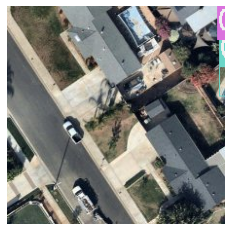

time: 84.5 ms (started: 2021-03-08 08:50:51 +00:00)


In [97]:
show_record(train_records[0], display_label=True)

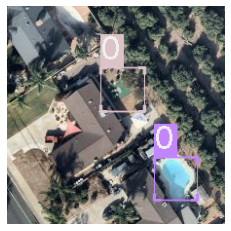

time: 87.4 ms (started: 2021-03-08 08:50:51 +00:00)


In [98]:
show_record(train_records[1], display_label=True)

In [99]:
len(train_records)

1678

time: 2.31 ms (started: 2021-03-08 08:50:51 +00:00)


## Transforms



In [100]:
presize = 512
size = 384

time: 847 µs (started: 2021-03-08 08:50:51 +00:00)


In [101]:
valid_tfms = tfms.A.Adapter([
                             *tfms.A.resize_and_pad(size),\
                             tfms.A.VerticalFlip(),\
                             tfms.A.HorizontalFlip(),\
                             tfms.A.Normalize()
                             ])

train_tfms = tfms.A.Adapter([
                             *tfms.A.aug_tfms(size=size, presize=presize),\
                             tfms.A.RandomResizedCrop(size, size, p = 1),\
                             tfms.A.VerticalFlip(),\
                             tfms.A.HorizontalFlip(),\
                            #  image_dehaze(),\
                             tfms.A.MedianBlur(blur_limit = 3),\
                             tfms.A.GaussNoise(),\
                            #  tfms.A.ChannelDropout(),\
                            #  tfms.A.ChannelShuffle(),\
                             tfms.A.Transpose(),\
                             tfms.A.ShiftScaleRotate(),\
                             tfms.A.HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit=0.2, val_shift_limit=0.2, p=0.5),\
                             tfms.A.RandomBrightnessContrast(brightness_limit=(-0.1,0.1), contrast_limit=(-0.1, 0.1), p=0.5),\
                            #  tfms.A.Cutout(),\
                            #  tfms.A.Downscale(),\
                            #  relative_luminance(),\
                             tfms.A.Normalize()
                            ])

time: 13.8 ms (started: 2021-03-08 08:50:51 +00:00)


## Dataset

The `Dataset` class combines the records and transforms.

To create a `Dataset`, we just need need to pass the parsed records from the previous step along with the transforms.


In [102]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

time: 1.27 ms (started: 2021-03-08 08:50:51 +00:00)


### Displaying the same image with different transforms

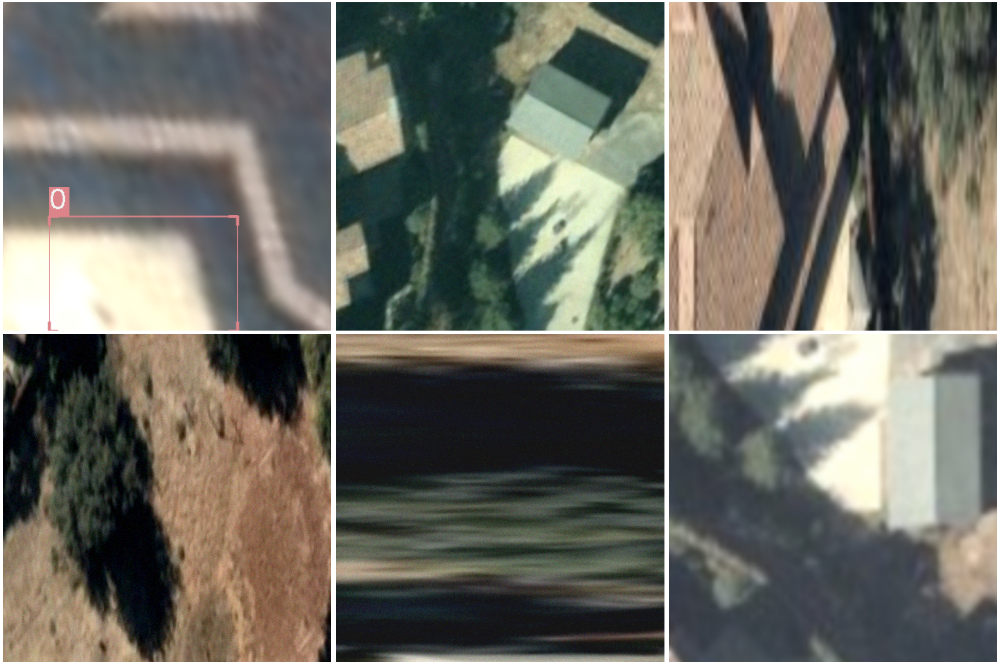

time: 3.87 s (started: 2021-03-08 08:50:51 +00:00)


In [103]:
samples = [train_ds[3] for _ in range(6)]
show_samples(samples, ncols=3)

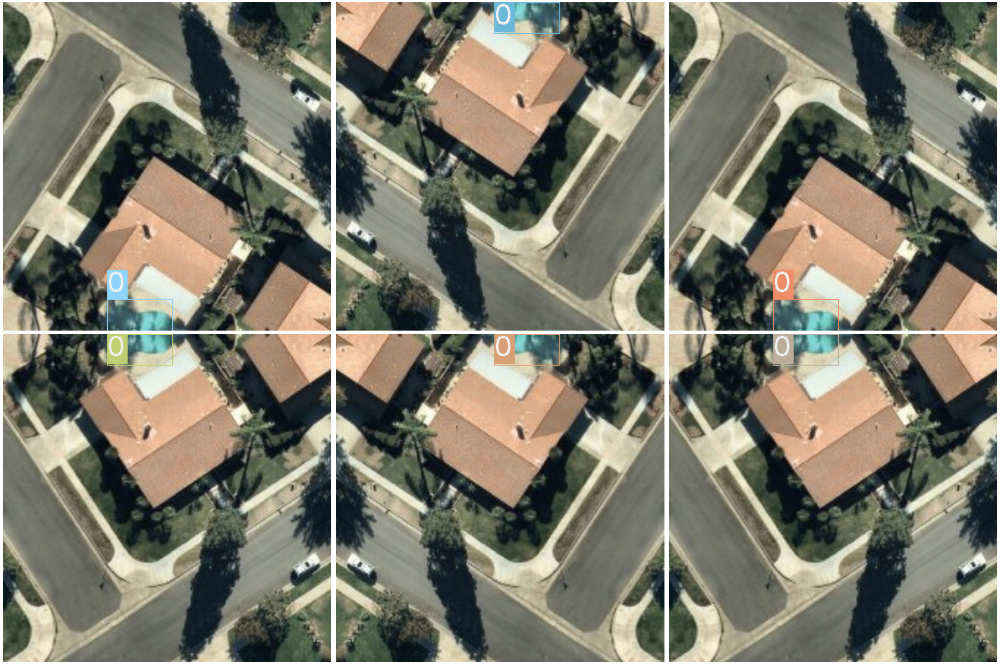

time: 3.78 s (started: 2021-03-08 08:50:55 +00:00)


In [104]:
samples = [valid_ds[3] for _ in range(6)]
show_samples(samples, ncols=3)

## Training 


In [105]:
def free_mem():
  import gc;gc.collect()
  torch.cuda.empty_cache()

model = faster_rcnn.model(num_classes=2) # changed

time: 1 s (started: 2021-03-08 08:50:59 +00:00)


In [106]:
train_dl = faster_rcnn.train_dl(train_ds, batch_size=16, num_workers=4, shuffle=True)
valid_dl = faster_rcnn.valid_dl(valid_ds, batch_size=16, num_workers=4, shuffle=False)

time: 2.45 ms (started: 2021-03-08 08:51:00 +00:00)


In [107]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

time: 987 µs (started: 2021-03-08 08:51:00 +00:00)


## Fit one cycle

AssertionError: ignored

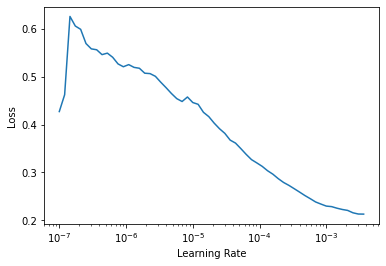

time: 3min 29s (started: 2021-03-08 08:51:00 +00:00)


In [108]:
free_mem()
learn = faster_rcnn.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)
lr, _ = learn.lr_find()
learn.fit_one_cycle(5, lr*10)

In [ ]:
learn.fit_one_cycle(5, lr)

In [ ]:
lr, _ = learn.lr_find()
learn.fit_one_cycle(5, lr)

In [ ]:
lr, _ = learn.lr_find()
learn.fit_one_cycle(5, lr)

In [ ]:
lr, _ = learn.lr_find()
learn.fit_one_cycle(10, lr)

In [ ]:
lr, _ = learn.lr_find()
learn.fit_one_cycle(10, lr)

In [ ]:
faster_rcnn.show_results(model, valid_ds)

## Fine tune

In [ ]:
free_mem()
learn = faster_rcnn.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)
lr, _ = learn.lr_find()
learn.fine_tune(10, lr)

In [ ]:
lr, _ = learn.lr_find()
learn.fine_tune(10, lr)

In [ ]:
lr, _ = learn.lr_find()
learn.fine_tune(10, lr)

In [ ]:
faster_rcnn.show_results(model, valid_ds)

## Labelsmoothing

In [ ]:
learn.loss_func = LabelSmoothingCrossEntropy()

In [ ]:
free_mem()
learn = faster_rcnn.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)
lr, _ = learn.lr_find()
learn.fine_tune(10, lr)

In [ ]:
learn.unfreeze()
lr, _ = learn.lr_find()
learn.fine_tune(10, lr)

In [ ]:
learn.unfreeze()
lr, _ = learn.lr_find()
learn.fine_tune(10, lr)

In [ ]:
faster_rcnn.show_results(model, valid_ds)

## EfficientDet

In [ ]:
train_dl = efficientdet.train_dl(train_ds, batch_size=16, num_workers=4, shuffle=True)
valid_dl = efficientdet.valid_dl(valid_ds, batch_size=16, num_workers=4, shuffle=False)

In [ ]:
model = efficientdet.model(model_name='tf_efficientdet_lite0', num_classes=2, img_size=size)

In [ ]:
metrics = [COCOMetric()]

In [ ]:
learn = efficientdet.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

### Fastai Training

In [ ]:
lr, _ = learn.lr_find()
learn.fine_tune(10, lr)

In [ ]:
lr, _ = learn.lr_find()
learn.fine_tune(10, lr)

In [ ]:
lr, _ = learn.lr_find()
learn.fine_tune(10, lr)

In [ ]:
efficientdet.show_results(model, valid_ds)